# Sampling a Large Graph and Training a Link Prediction Pipeline in Neo4j

The dataset we are going to use in this notebook is the Twitch Gamers Social Network dataset taken from https://snap.stanford.edu/data/twitch_gamers.html. Nodes in the dataset represent the social network users, whilst the mutual friendships between users are represented with undirected edges. There are 168114 nodes and 6797557 edges in the resulting strongly-connected graph (every node can be reached from every other node). 

Graphs of real-world datasets can be very large. Running Machine Learning algorithms on very large graphs is very computationally expensive and may not be possible in some cases. So we have to look for alternative approaches. One option is to perform a node embedding. Another is to sample the graph, with the idea being that we extract a much smaller subgraph that is still a good representation of the original large graph. In this notebook we are going to look at two graph sampling methods: k-hop neighbourhood sampling and random-walk sampling.

We will start by taking a look at the raw data files. We have a file containing the nodes and their features, and another containing the edges. The edges are supposed to be undirected, but in the files the relationships are only given in one direction, so there should actually be twice this number of directed edges (an undirected edge can be represented by two directed edges in opposite directions).

In [1]:
# view first five line of nodes file
with open('twitch_nodes.csv', 'r') as infile:
    i = 0
    for line in infile:
        if i < 6:
            print(line)
            i += 1
        else:
            break
    infile.close()

views,mature,life_time,created_at,updated_at,numeric_id,dead_account,language,affiliate

7879,1,969,2016-02-16,2018-10-12,0,0,EN,1

500,0,2699,2011-05-19,2018-10-08,1,0,EN,0

382502,1,3149,2010-02-27,2018-10-12,2,0,EN,1

386,0,1344,2015-01-26,2018-10-01,3,0,EN,0

2486,0,1784,2013-11-22,2018-10-11,4,0,EN,0



In [2]:
# view the first six line of the edges file
with open('twitch_edges.csv', 'r') as infile:
    i = 0
    for line in infile:
        if i < 6:
            print(line)
            i += 1
        else:
            break
    infile.close()

98343,141493

98343,58736

98343,140703

98343,151401

98343,157118

98343,125430



Later we are going to be training a link prediction pipeline in Neo4j. The edge and node files will be uploaded into Neo4j using the admin import tool, which requires the files to be formatted in a specific way. In addition the link prediction pipeline does not support the use of dates. However, we still want to retain this information so we will convert all dates to integers, setting the earliest occurring date in the dataset to zero and adding one for every subsequent day.

To this end we introduce a couple of data preprocessing functions: one to format the nodes for import and map the dates to integers and another to duplicate the directed edges in an edge file.

In [3]:
import pandas as pd
import numpy as np


class Data_preprocessing:
    
    def __init__(self, edges_infile, nodes_infile):
        
        self.edges_infile = edges_infile
        self.nodes_infile = nodes_infile
    
        
    def format_nodes_for_neo4j(self, nodes_outfile):
        
        df = pd.read_csv(self.nodes_infile)
        ser1 = df['created_at']
        ser2 = df['updated_at']
        arr1 = ser1.to_numpy()
        arr2 = ser2.to_numpy()
        sort_arr1 = np.sort(arr1)
        sort_arr2 = np.sort(arr2)
        min_1, max_1 = sort_arr1[0], sort_arr1[-1]
        min_2, max_2 = sort_arr2[0], sort_arr2[-1]
        youngest_date = max(max_1, max_2)
        oldest_date = min(min_1, min_2)
        range = pd.date_range(oldest_date, youngest_date, freq='d')
        dates = pd.to_datetime(range)
        dates_to_strings = dates.strftime('%Y-%m-%d')
        dates_list = [i for i in dates_to_strings]
        dates_dict = {}
        for i, date in enumerate(dates_list):
            dates_dict[date] = i 
        df['created_at2'] = df['created_at'].map(dates_dict)    
        df['updated_at2'] = df['updated_at'].map(dates_dict)
        df = df.drop(['updated_at', 'created_at'], axis = 1)
        df.rename(columns = {'updated_at2': 'updated_at', 'created_at2': 'created_at', 'numeric_id': 'numeric_id:ID'},
                  inplace=True)
        df[':LABEL'] = 'User1'
        df.to_csv(nodes_outfile, index = False)
        
        
    def reciprocate_edges(self, undirected_edges_outfile):
        
        with open(undirected_edges_outfile, 'w') as outfile:
            with open(self.edges_infile, 'r') as infile:
                next(infile)
                for line in infile:
                    outfile.write(line)
                    line_split = line.split(',')
                    source = line_split[0]
                    dest = line_split[1][:-1]
                    outfile.write(dest)
                    outfile.write(',')
                    outfile.write(source)
                    outfile.write('\n')
                infile.close()
            outfile.close()        

Let's create an object and view the end result produced by the node formatting function.

In [5]:
# create object
data = Data_preprocessing('twitch_edges.csv', 'twitch_nodes.csv')
# reformat the nodes file
data.format_nodes_for_neo4j('twitch_nodes_conv.csv')
# view the first five lines of the reformatted file
with open('twitch_nodes_conv.csv', 'r') as infile:
    i = 0
    for line in infile:
        if i < 6:
            print(line)
            i += 1
        else:
            break
    infile.close()

views,mature,life_time,numeric_id:ID,dead_account,language,affiliate,created_at,updated_at,:LABEL

7879,1,969,0,0,EN,1,3192,4161,User1

500,0,2699,1,0,EN,0,1458,4157,User1

382502,1,3149,2,0,EN,1,1012,4161,User1

386,0,1344,3,0,EN,0,2806,4150,User1

2486,0,1784,4,0,EN,0,2376,4160,User1



In the edges file, the undirected edges are represented as a single directed edge. As we will see later this is of no consequence for the k-hop neighbourhood sampling algorithm we will run. However, to correctly sample undirected edges using the random walk method we require two directed and opposite edges between any given two nodes. Therefore, we must have a file consisting of the original edges and their opposites. To this end we employ the reciprocate_edges function.

In [6]:
# run the function
data.reciprocate_edges('twitch_undirected_edges.csv')
# view the first six lines of the file
# the new edge file should contain reciprocal edges of those in the original file
with open('twitch_undirected_edges.csv', 'r') as infile:
    i = 0
    for line in infile:
        if i < 6:
            print(line)
            i += 1
        else:
            break
    infile.close()

98343,58736

58736,98343

98343,140703

140703,98343

98343,151401

151401,98343



We could generate a subgraph by randomly selecting nodes and their associated edges, or by randomly selecting edges and their associated nodes. The produced graphs would be sparse and not very representative of the original graph. Several papers have shown that k-hop neighbourhood sampling and random-walk sampling are generally two of the better sampling methods available. In k-hop neighbourhood sampling we select a starting node and then find all the other nodes that can be reached from this node by travelling along $k$, or fewer, edges. These found nodes and all the edges that are travelled along form the sampled subgraph. In a random walk, we depart a selected starting node and travel to one of its adjacent nodes, chosen at random. Upon arriving at this new node, we depart to a randomly chosen adjacent node, and so on, until the walk length has been reached.

We begin by defining some functions that will be the foundations of our sampling methods.

In [7]:
import random

class Graph:
    
    def __init__(self, edges_file, nodes_file):
        
        self.edges_file = edges_file
        self.nodes_file = nodes_file
        
        
    def get_adjacent_nodes(self, input_nodes):
        
        adjacent_nodes = []
        connections = {}
        
        # for each node in the input...
        for i in input_nodes:
            # create empty list
            updated_nodes = []
            # read lines from edge file and get source and edge nodes
            with open(self.edges_file) as infile:
                for line in infile:
                    line = line.split(',')
                    source = int(line[0])
                    dest = int(line[1])
                    # if source node is equal to the input node...
                    if source == i:
                        # add nodes to lists
                        adjacent_nodes.append(dest)
                        updated_nodes.append(dest)
            
            # add all identified adjacent nodes to dictionary 
            connections[i] = updated_nodes
        # discard repeated nodes from list    
        all_nodes = list(set(adjacent_nodes))
        
        return all_nodes, connections
    
    
    def random_walk(self, input_node, walk_length):
        
        walk = []
        # add input node to walk list
        walk.append(input_node)
        # for each step in the walk length...
        for step in range(walk_length):
            # find the adjacent nodes to input node
            adjacent_nodes = self.get_adjacent_nodes([input_node])[0]
            # choose one of the adjacent nodes at random
            rand_node = random.choice(adjacent_nodes)
            # add this node to the walk list
            walk.append(rand_node)
            # repeat walk starting from the randomly chosen node
            input_node = rand_node
            
        return walk                    

To see what these functions do, we will employ a test dataset of directed edges.

In [8]:
# view test edge file
with open('test_edges.csv', 'r') as infile:
    for line in infile:
        print(line)
    infile.close()

1,3

1,6

1,10

2,3

2,5

3,8

3,9

4,2

4,6

5,2

5,7

6,9

6,10

7,8

8,2

8,9

9,7

9,8

10,5

10,8

10,9


We will look at the get_adjacent_nodes function first.

In [9]:
# generate graph object
test_graph = Graph('test_edges.csv', 'test_nodes.csv')
# call function for the starting nodes 1, 5, 10
print(test_graph.get_adjacent_nodes([1]))
print(test_graph.get_adjacent_nodes([5]))
print(test_graph.get_adjacent_nodes([10]))

([10, 3, 6], {1: [3, 6, 10]})
([2, 7], {5: [2, 7]})
([8, 9, 5], {10: [5, 8, 9]})


For each input node the function returns the other nodes that we can reach by travelling along a single edge. Verify this by referring back to the edges in the test file above.

Now we turn to the random_walk function:

In [34]:
# perform random walk of length 4, starting from node 1
print(test_graph.random_walk(1, 4))

[1, 10, 9, 8, 9]


Above we have performed a random walk of length 4, starting from node 1. In the random walk we leave node 1, proceed to node 10, then to node 9, then to node 8, before arriving back at node 9. Again, verify that this is possible by viewing the edges file above. 

To create a k-hop neighbourhood we have to find the adjacent nodes to the start node, then find the adjacent nodes to these nodes, and so on until this procedure has been performed $k$ times. 

To sample using random walks we can repeatedly perform random walks from a start node, and store all the nodes and edges encountered in each walk. The subgraph will then consist of these nodes and edges. 

Let's have a look at the functions that will perform these two sampling techniques:

In [1]:
import random

class Graph:
    
    def __init__(self, edges_file, nodes_file):
        
        self.edges_file = edges_file
        self.nodes_file = nodes_file
        
        
    def get_adjacent_nodes(self, input_nodes):
        
        adjacent_nodes = []
        connections = {}
        
        for i in input_nodes:
            updated_nodes = []
            with open(self.edges_file) as infile:
                for line in infile:
                    line = line.split(',')
                    source = int(line[0])
                    dest = int(line[1])
                    if source == i:
                        adjacent_nodes.append(dest)
                        updated_nodes.append(dest)
                                    
            connections[i] = updated_nodes
        all_nodes = list(set(adjacent_nodes))
        
        return all_nodes, connections
    
    
    def random_walk(self, input_node, walk_length):
        
        walk = []
        walk.append(input_node)
        for step in range(walk_length):
            adjacent_nodes = self.get_adjacent_nodes([input_node])[0]
            if adjacent_nodes == []:
                break
            else:
                rand_node = random.choice(adjacent_nodes)
                walk.append(rand_node)
                input_node = rand_node
            
        return walk
                    
    
    def k_hop_neighbourhood(self, input_node, hops, nbhood_edges_file, nbhood_nodes_file):
        
        input_node = [input_node]
        nodes = input_node
        hops_list = []
        # for each hop...
        for hop in range(hops):
            # get the adjacent nodes to input node
            adjacent_nodes = self.get_adjacent_nodes(input_node)
            # add connections dictionary to hops_list
            hops_list.append(adjacent_nodes[1])
            # set input node to the list of adjacent nodes
            input_node = adjacent_nodes[0]
            # add adjacent nodes to the nodes list
            nodes.extend(input_node)
        # discard repeated nodes    
        all_nodes = list(set(nodes))
        
        # create edges dictionary from the first connections dictionary
        edges_dict = hops_list[0]
        # extract all other connection dictionaries, discarding any repeats
        for hop in range(1, len(hops_list)):
            edges_dict.update(hops_list[hop])
        
        # write edges from edge_dict to file
        with open(nbhood_edges_file, 'w') as outfile:
            outfile.write(':TYPE,:START_ID,:END_ID')
            outfile.write('\n')
            for i in edges_dict:
                for j in edges_dict[i]:
                    outfile.write('FRIENDS')
                    outfile.write(',')
                    outfile.write(str(i))
                    outfile.write(',')
                    outfile.write(str(j))
                    outfile.write('\n')
            outfile.close()
    
            
        with open(nbhood_nodes_file, 'w') as outfile2:
            outfile2.write('views,mature,life_time,numeric_id:ID,dead_account,language,affiliate,created_at,updated_at,:LABEL')
            outfile2.write('\n')
            with open(self.nodes_file, 'r') as infile:
                next(infile)
                # for each line in nodes infile...
                for line in infile:
                    line_split = line.split(',')
                    # if node in all_nodes is found in the nodes infile, write the node features to outfile
                    if int(line_split[3]) in all_nodes:
                        outfile2.write(line)
                infile.close()
            outfile2.close()
            
            
    def random_walk_sampling(self, input_node, walk_length, num_walks, walk_edges_file, walk_nodes_file):
        
        nodes = [input_node]
        with open(walk_edges_file, 'w') as outfile:
            outfile.write(':TYPE,:START_ID,:END_ID')
            outfile.write('\n')
            # for each random-walk...
            for i in range(num_walks):
                # perform random-walk
                walk = self.random_walk(input_node, walk_length)
                # add nodes visited in walk to nodes list
                nodes.extend(walk)
                # write edges from walk to file
                for j in range(len(walk)-1):
                    outfile.write('FRIENDS')
                    outfile.write(',')
                    outfile.write(str(walk[j]))
                    outfile.write(',')
                    outfile.write(str(walk[j+1]))
                    outfile.write('\n')
        outfile.close()
        # discard any repeated nodes from nodes list
        all_nodes = list(set(nodes))                
        with open(walk_nodes_file, 'w') as outfile2:
            outfile2.write('views,mature,life_time,numeric_id:ID,dead_account,language,affiliate,created_at,updated_at,:LABEL')
            outfile2.write('\n')
            with open(self.nodes_file, 'r') as infile:
                next(infile)
                # for each line in nodes infile...
                for line in infile:
                    line_split = line.split(',')
                    # if node in all_nodes is found in the nodes infile, write the node features to outfile
                    if int(line_split[3]) in all_nodes:
                        outfile2.write(line)
            outfile2.close()
            

We are going to generate a 2-hop neighbourhood centred on node 98343, and a subgraph produced with 500 random walks of length 3 starting from node 89118. The random walk sampling algorithm is very slow to run so we have settled with generating a relatively small subgraph.

We will create two graph objects, one for each of the subgraphs we are going to generate. We do this because the two sampling methods will use different input files of edges. To perform the random walk sampling correctly we must give the algorithm the option of returning via the edge it has just travelled along on its next walk step. For this we will employ the edges file containing the reciprocated edges (edges travelling in both directions between two nodes). For the k-hop neighbourhood sampling we can use the file with the edges in only one direction and take advantage of Neo4j to project these edges in both directions when we are preparing to train our link prediction model. The structure of the graph will be unchanged; the same nodes will be identified in the neighbourhood, but the edges will only exist in one direction.

In [ ]:
# create graph objects
twitch_graph_rw = Graph('twitch_undirected_edges.csv', 'twitch_nodes_conv.csv')
twitch_graph_k = Graph('twitch_edges.csv', 'twitch_nodes_conv.csv')
# generate graph node and edge files
twitch_graph_k.k_hop_neighbourhood(98343, 2, 'two_hop_edges_neo4j.csv', 'two_hop_nodes_neo4j.csv')
twitch_graph_rw.random_walk_sampling(89118, 3, 500, 'rw_edges.csv', 'rw_nodes.csv')

The Neo4j admin import tool is excellent for loading large and very large graphs into Neo4j relatively quickly. Having done this we can visualise our sampled subgraphs. Let's look at the 2-hop neighbourhood first. It consists of 41333 nodes and 67288 edges, and we can just about visualise it in Neo4j.

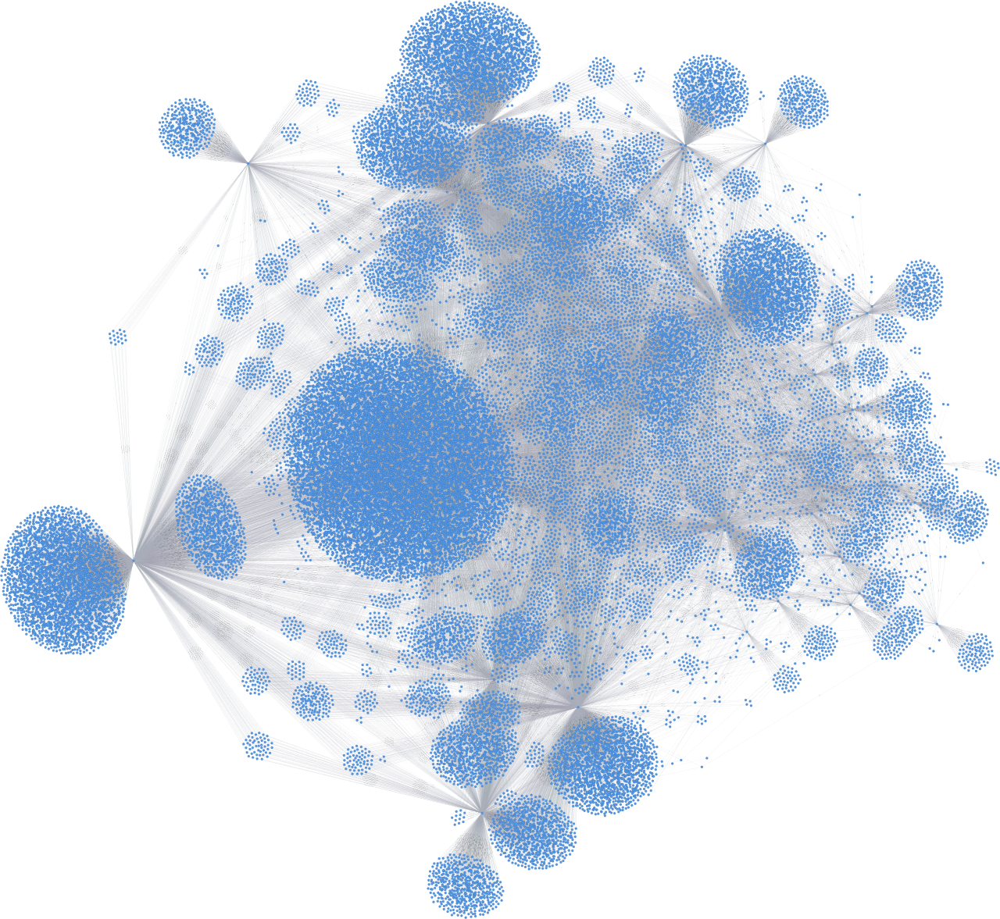

It is hard to believe that every single node in this subgraph can be reached from the input node by travelling along one or two edges, but this is the case.

Now let's take a look at the subgraph generated using random walks. It consists of 1100 nodes and 1210 edges. The random_walk_sampling function used above also creates many duplicate edges as the random walks often repeat the same journeys (or segments of journeys). This issue was not addressed when creating the function as the duplicate edges are easily removed in Neo4j.

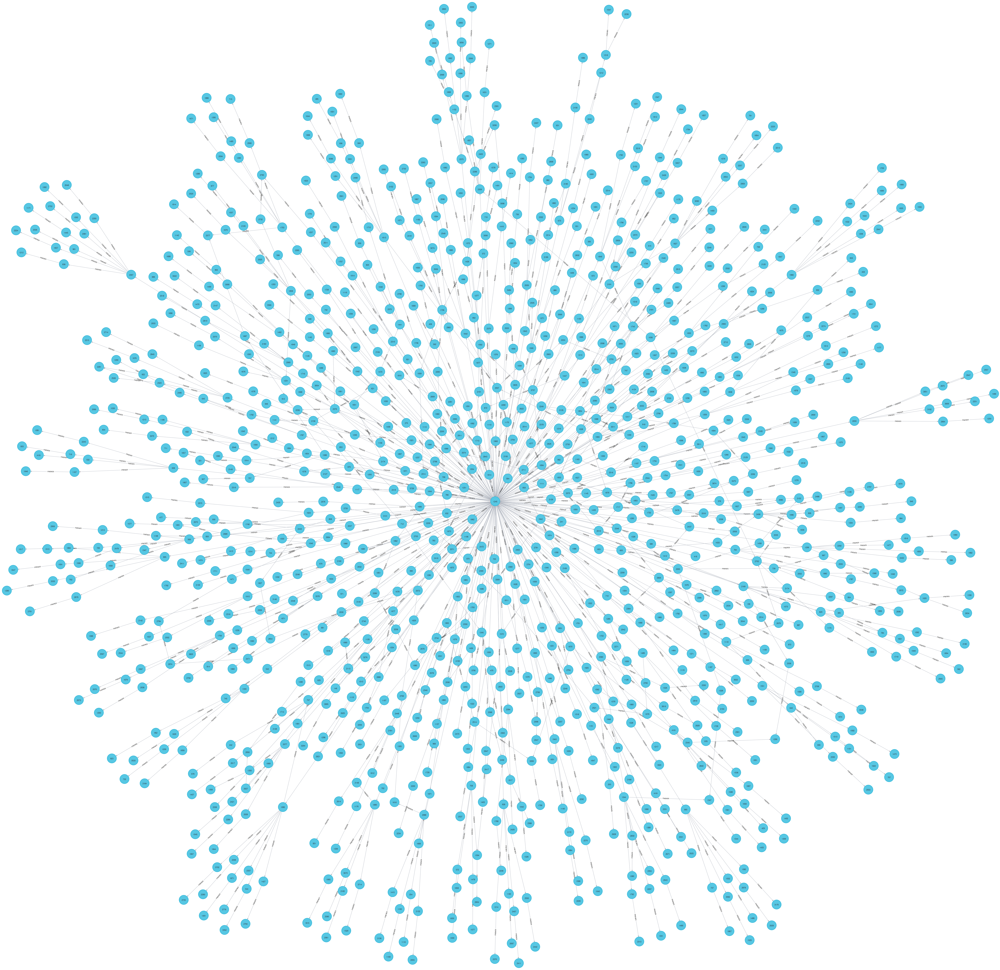

Note that there are very few undirected edges (directed edges running in both directions between two nodes). Say we arrive at a node and have to randomly choose between nine new nodes and the node we have just arrived from for the next segment of our walk. The chance of us travelling back to the node we have arrived from (therefore creating an undirected edge) is only 10%. This is what is happening in the random walk subgraph.

Now that we have our two sampled subgraphs, we are going to use them to train link prediction models. Neo4j has the inbuilt GraphDataScience (GDS) library that contains a variety of graph algorithms for different types of problems. To make things even more convenient, the GDS library has a Python API which can be employed to mimimise or eliminate the usage of the Cypher language. 

Below we create a Neo4j class graph which will initialise a connection with the Neo4j server when an instance is created. The project_graph function projects the graph in the Neo4j database into the graph catalog, on which the algorithms in the GDS library can be run.
 
The link_predict_pipeline function intitally creates a link prediction pipeline object. Next we add a feature step that computes a feature vector for given node pairs from the node properties. Next we choose the model that we are going to employ to train the pipeline, in our case logisitc regression. Then the pipeline is trained and appropriate metrics returned.

Our link prediction pipeline is very basic. There are several additional steps that can be added, and numerous parameters that can be configured during the training. 

In [16]:
from graphdatascience import GraphDataScience

class Neo4j_graph:
    
    def __init__(self, url, username, password, node_label, edge_label, node_properties):
        
        self.url = url
        self.username = username
        self.password = password
        self.node_label = node_label
        self.edge_label = edge_label
        self.node_properties = node_properties
        # use the above attributes to establish a connection with Neo4j
        self.gds = GraphDataScience(self.url, auth = (self.username, self.password))
        
        
    def project_graph(self, proj_name):
        
        # project graph from Neo4j database to memory 
        G, res = self.gds.graph.project(proj_name, self.node_label, {self.edge_label: {"orientation": "UNDIRECTED"}} , 
                           nodeProperties = self.node_properties)
        return G, res
    
    
    def link_pred_pipeline(self, pipeline_name, feature, train_graph, model_name):
        
        # create a pipeline object
        pipeline, res = self.gds.beta.pipeline.linkPrediction.create(pipeline_name)
        # add feature to pipeline for model learning
        pipeline.addFeature(feature, nodeProperties = self.node_properties)
        # add classifier to the pipeline
        pipeline.addLogisticRegression()   
        # train the pipeline on an input graph
        trained_pipeline, res2 = pipeline.train(train_graph, modelName = model_name)
        return trained_pipeline, res2

Now we define the node properties that we want to include in our model and project the two-hop subgraph from the database into memory.

In [17]:
# define node properties
node_properties = ['numeric_id', 'mature', 'affiliate', 'dead_account', 'life_time', 'views', 'created_at', 'updated_at']
# establish Neo4j connection
two_hop = Neo4j_graph('neo4j://localhost:7687', 'neo4j', 'martinneo4j', 'User1', 'FRIENDS', node_properties)
# project graph into memory
two_hop_subgraph, res1 = two_hop.project_graph('two_hop')

The graph projection object has several useful methods for summarising the graph:

In [18]:
print('Number of nodes: {}'.format(two_hop_subgraph.node_count()))
print('Number of edges: {}'.format(two_hop_subgraph.relationship_count()))
print('Graph density: {:.6f}'.format(two_hop_subgraph.density()))
print('Degree distribution:')
print(two_hop_subgraph.degree_distribution())

Number of nodes: 41333
Number of edges: 134576
Graph density: 0.000079
Degree distribution:
p99         7.000000
min         1.000000
max     18349.000000
mean        3.255897
p90         3.000000
p50         1.000000
p999       21.000000
p95         4.000000
p75         2.000000
dtype: float64


Note that the number of edges in the projected graph is twice that of the graph in the databse (since we have projected them to be undirected edges now). The node with the maximum number of edges (incoming and outgoing) has 18349 edges. The graph (projection) density is given by $E / V(V-1)$, where $E$ is the number of edges and $V$ is the number of nodes.

Now we will train the pipeline on the projected graph. There are many possible training configurations, but we will keep it simple using the default stratified three-fold cross validation and test set size of 0.1.

For the required feature step we are going to employ the Cosine feature. For each potential relationship, the node properties of the associated nodes are concatenated into the feature vectors $s = [s_1, s_2, s_3, ..., s_n]$ for the source node, and $t = [t_1, t_2, t_3, ...,t_n]$ for the target node. From these the feature vector $f$ is produced:

$$f = \frac{\sum_{i=1}^ns_it_i}{\sqrt{\sum_{i=1}^ns_i^2}\sqrt{\sum_{i=1}^nt_i^2}}$$

These feature vectors are what is used by the link prediction model to learn.

In [19]:
# train the link prediction pipeline on the two-hop neighbourhood subgraph and print the AUCPR metrics
trained_pipeline, res2 = two_hop.link_pred_pipeline('pipeline', 'COSINE', two_hop_subgraph, 'model')
print(trained_pipeline.metrics()['AUCPR'])

{'test': 0.863521453765027, 'outerTrain': 0.8703684746707882, 'validation': {'avg': 0.8705830869684066, 'min': 0.8597617842412312, 'max': 0.8766102586370846}, 'train': {'avg': 0.8704336958444694, 'min': 0.8674549016725052, 'max': 0.875677124359774}}


The metric employed to measure the performance of our model is the area under the precision-recall curve (AUCPR). Several papers recommend the evaluation of link prediction with the AUCPR. Precision is defined as 
$$P = \frac{|TP|}{|TP| + |FP|}$$
and recall as
$$R = \frac{|TP|}{|TP| + |FN|}$$
where $|TP|$ is the number of true-positives, $|FP|$ is the number of false-positives, and $|FN|$ is the number of false-negatives. Precision essentially tells us the proportion of positive predictions that are actually correct, whereas the recall gives us the proportion of positive samples that are correctly predicted. A good classifier therefore, will have precision and recall close to one, and consequently, an AUCPR close to one indicates a classifier with excellent performance.

Our trained link prediction pipeline with an AUCPR of 0.86 on the test data isn't a bad starting point. We could improve this score with some configuration amendments and hyperparameter tuning. 

Now we turn our attention to the subgraph sampled with random walks. We begin by projecting the graph from the database into memory in Neo4j.

In [31]:
# create graph object
rw = Neo4j_graph('neo4j://localhost:7687', 'neo4j', 'martinneo4j', 'User1', 'FRIENDS', node_properties)
# project graph from Neo4j database to memory
rw_subgraph, res3 = rw.project_graph('random_walk')

# print graph summary
print('Number of nodes: {}'.format(rw_subgraph.node_count()))
print('Number of edges: {}'.format(rw_subgraph.relationship_count()))
print('Graph density: {:.6f}'.format(rw_subgraph.density()))
print('Degree distribution:')
print(rw_subgraph.degree_distribution())

Number of nodes: 1100
Number of edges: 3000
Graph density: 0.002482
Degree distribution:
p99      10.000000
min       1.000000
max     508.000000
mean      2.727273
p90       4.000000
p50       2.000000
p999     20.000000
p95       7.000000
p75       2.000000
dtype: float64


We will utilise the same pipeline archictecture as earlier, but this time we will employ the Hadamard feature, with which the feature vector is defined by 
$$f = [s_1t_1, s_2t_2, s_3t_3, ..., s_nt_n]$$

In [32]:
# train the link prediction pipeline on the random-walk subgraph and print the AUCPR metrics
trained_pipeline2, res4 = rw.link_pred_pipeline('pipeline', 'HADAMARD', rw_subgraph, 'model2')
print(trained_pipeline2.metrics()['AUCPR'])

{'test': 0.7448979591836735, 'outerTrain': 0.75, 'validation': {'min': 0.7212301587301587, 'avg': 0.7404100529100529, 'max': 0.75}, 'train': {'min': 0.6705790297339593, 'avg': 0.7235263432446531, 'max': 0.75}}


Again, an AUCPR of 0.75 on the test set is not a bad starting point, and this could be improved by carefully configuring the pipeline and tuning the hyperparameters. If we could perform the random-walk sampling with more walks, or with longer walk lengths, or with both, the sampled subgraph would contain more nodes and edges and we could be confident of obtaining a better AUCPR on the test set.

Once we have trained a Machine Learning model on a sampled subgraph we may ask "How do we know that our learning or results can be applied to the larger graph or a distinct subgraph?" We need some way of determining how similar our sampled subgraph is to the larger graph. There are many techniques for doing this, and it is best that several of these are combined to ensure that the subgraph is a good representation. Prominent methods include the evaluation of the in- and out-degree distribution, the distribution of weakly- and strongly-connected components, the distribution of the clustering coefficient, and the distribution of the graph spectral properties. 